In [1]:
using Plots
using DataFrames
using CSV
using Statistics

In [2]:
results = CSV.read("results.csv")

,type,size,time
,String⍰,Int64⍰,Float64⍰
1,naive,1,6.0e-6
2,naive,1,5.0e-6
3,naive,1,5.0e-6
4,naive,1,5.0e-6
5,naive,1,5.0e-6
6,naive,1,5.0e-6
7,naive,1,5.0e-6
8,naive,1,5.0e-6
9,naive,1,5.0e-6


In [3]:
df_agg = by(results, [:size, :type]) do subGroup
    DataFrame(AvgTime = mean(subGroup.time), StDev = std(subGroup.time))
end

,size,type,AvgTime,StDev
,Int64⍰,String⍰,Float64,Float64
1,1,naive,5.1e-6,3.16228e-7
2,50,naive,0.0014636,0.00135243
3,100,naive,0.0244978,0.00693843
4,500,naive,1.93436,0.37392
5,1000,naive,17.5381,6.66911
6,1100,naive,31.2614,9.36956
7,1200,naive,42.8949,4.26266
8,1300,naive,59.9929,12.5511
9,1400,naive,73.4805,10.1046


In [4]:
sort(df_agg, [:size, :AvgTime])

,size,type,AvgTime,StDev
,Int64⍰,String⍰,Float64,Float64
1,1,naive,5.1e-6,3.16228e-7
2,1,better,5.2e-6,4.21637e-7
3,1,blas,5.4e-6,5.16398e-7
4,50,blas,0.000461,0.00101447
5,50,naive,0.0014636,0.00135243
6,50,better,0.0017575,0.00214613
7,100,blas,0.002792,0.00162572
8,100,better,0.023085,0.00792847
9,100,naive,0.0244978,0.00693843


In [5]:
df_agg[:type] .== "naive"
df_naive = df_agg[df_agg[:type] .== "naive", :]

,size,type,AvgTime,StDev
,Int64⍰,String⍰,Float64,Float64
1,1,naive,5.1e-6,3.16228e-7
2,50,naive,0.0014636,0.00135243
3,100,naive,0.0244978,0.00693843
4,500,naive,1.93436,0.37392
5,1000,naive,17.5381,6.66911
6,1100,naive,31.2614,9.36956
7,1200,naive,42.8949,4.26266
8,1300,naive,59.9929,12.5511
9,1400,naive,73.4805,10.1046


In [6]:
df_agg[:type] .== "better"
df_better = df_agg[df_agg[:type] .== "better", :]

,size,type,AvgTime,StDev
,Int64⍰,String⍰,Float64,Float64
1,1,better,5.2e-6,4.21637e-7
2,50,better,0.0017575,0.00214613
3,100,better,0.023085,0.00792847
4,500,better,1.68388,0.594637
5,1000,better,12.5741,4.89927
6,1100,better,17.8754,8.14766
7,1200,better,23.8305,5.22944
8,1300,better,32.7109,9.22493
9,1400,better,40.0962,6.30127


In [9]:
df_agg[:type] .== "blas"
df_lib = df_agg[df_agg[:type] .== "blas", :]

,size,type,AvgTime,StDev
,Int64⍰,String⍰,Float64,Float64
1,1,blas,5.4e-6,5.16398e-7
2,50,blas,0.000461,0.00101447
3,100,blas,0.002792,0.00162572
4,500,blas,0.555112,0.164736
5,1000,blas,2.90321,0.684585
6,1100,blas,4.3202,1.64738
7,1200,blas,5.18734,1.21155
8,1300,blas,7.73543,2.07953
9,1400,blas,8.24613,1.91997


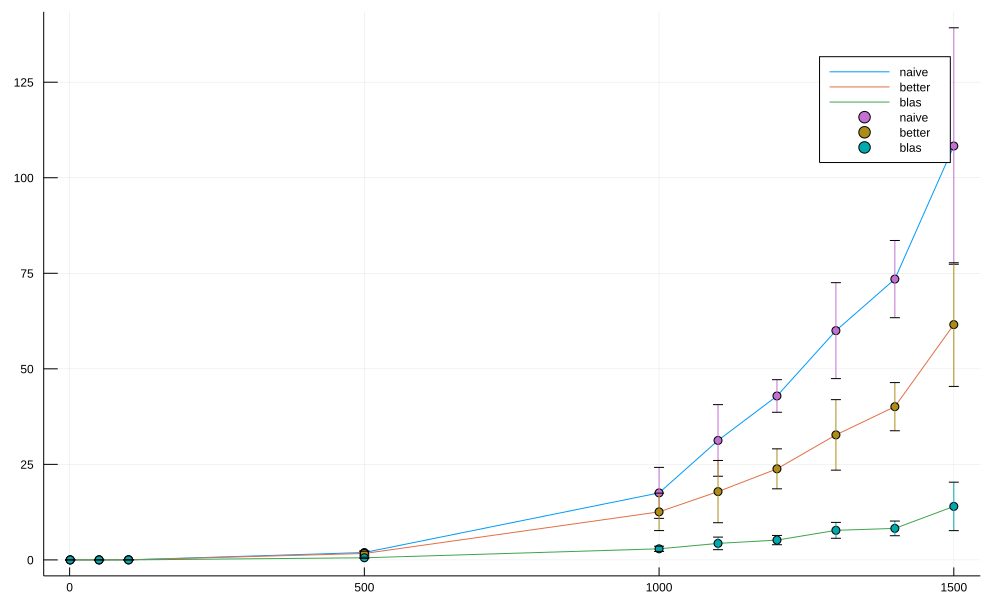

In [10]:
plot(df_lib[:size], [df_naive[:AvgTime], df_better[:AvgTime], df_lib[:AvgTime]], label = ["naive", "better", "blas"], size = (1000, 600))
scatter!(df_lib[:size], df_naive[:AvgTime], yerr = df_naive[:StDev], label = "naive")
scatter!(df_lib[:size], df_better[:AvgTime], yerr = df_better[:StDev], label = "better")
scatter!(df_lib[:size], df_lib[:AvgTime], yerr = df_lib[:StDev], label = "blas")